In [1]:
import argparse
import os
import copy

import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert
import supervision as sv
from segment_anything import build_sam, SamPredictor 
import cv2
import numpy as np
import matplotlib.pyplot as plt
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline
import json

from huggingface_hub import hf_hub_download
import supervision as sv
from pycocotools import mask as maskUtils
from pycocotools import mask
from skimage import measure

import time


In [2]:
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

sam_checkpoint = '/home/datadisk/evaluation/models/SAM/sam_vit_h_4b8939.pth'
sam = build_sam(checkpoint=sam_checkpoint)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)

In [3]:

### make segmentation mask to polygpn
def mask_to_poly
ground_truth_binary_mask = np.array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  0,   0,   0,   0,   0,   1,   1,   1,   0,   0],
                                     [  1,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
                                     [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0]], dtype=np.uint8)

fortran_ground_truth_binary_mask = np.asfortranarray(ground_truth_binary_mask)
encoded_ground_truth = mask.encode(fortran_ground_truth_binary_mask)
ground_truth_area = mask.area(encoded_ground_truth)
ground_truth_bounding_box = mask.toBbox(encoded_ground_truth)
contours = measure.find_contours(ground_truth_binary_mask, 0.5)

annotation = {"segmentation": [] }

for contour in contours:
    contour = np.flip(contour, axis=1)
    segmentation = contour.ravel().tolist()
    annotation["segmentation"].append(segmentation)
    
print(json.dumps(annotation, indent=4))

SyntaxError: invalid syntax (2300868286.py, line 2)

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    return mask_image
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  


def polygon_to_mask(polygon, image_height, image_width):
    # Create an empty mask
    mask = np.zeros((image_height, image_width), dtype=np.uint8)
    
    # Create a COCO-style RLE (Run-Length Encoding) mask from polygon
    rle = maskUtils.frPyObjects(polygon, image_height, image_width)
    
    # Decode the RLE mask to binary mask
    mask = maskUtils.decode(rle)
    
    return mask

def dice_coefficient(mask1, mask2):
    mask1 = mask1>0
    mask2 = mask2>0
    
    # Ensure masks are binary and have the same shape
    mask1 = np.asarray(mask1, dtype=np.bool_)
    mask2 = np.asarray(mask2, dtype=np.bool_)

    intersection = np.logical_and(mask1, mask2).sum()
    
    union = np.logical_or(mask1, mask2).sum()
    
    # Compute Dice coefficient
    dice = 2. * intersection / (intersection+union)  # Handle case where union is 0
    return dice



In [ ]:
file_path = '/home/datadisk/evaluation/data/Seg/iSAID/iSAID_val_20190823_114742_2.json'
# Load the JSON file
with open(file_path, 'r') as f:
    json_data = json.load(f)

data = json_data['data']

In [ ]:
index = 222
image_path = data[index]['image'][0]
print (image_path)
annotations = data[index]['annotations']

box_list = []
label_list = []
segmentation_poly = []
for annotation in annotations:
    box_list.append(annotation['bbox'])
    label_list.append(annotation['label'])
    segmentation_poly.append(annotation['segmentation'])
# for i, (x, y, w, h) in enumerate(box_list):
#     print ((x, y, w, h))

#print (annotations)
len(box_list)

In [ ]:
# set image
image_path = data[index]['image'][0]
local_image_path = '/home/datadisk/evaluation/data/Benchmark/datasets/'+image_path

image = cv2.imread(local_image_path)
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

sam_predictor.set_image(image_source)
H, W, _ = image_source.shape

plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()

In [4]:

def perform_segmentation(predictor, image_path, box_list, expanded_rate=0.15, dice_cal=True, segmentation_poly="", 
                         label_list = "", visualization=True, show_box=True, show_text=True):
    #load image
    image = cv2.imread(image_path)
    image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    H, W, _ = image_source.shape
    
    #set image
    sam_predictor = predictor
    sam_predictor.set_image(image_source)

    #setup image for visualization
    main_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gt_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    #crop roi
    roi_list = box_list
    
    dice_list = []
    roi_mask_list = []
    # Iterate over the ROI list and crop the image
    for indexing, (x, y, w, h) in enumerate((roi_list)):

        isError = False
        #expanded = int(w*expanded_rate)
        
        if w > h:
            expanded = int(h*expanded_rate)
        else:
            expanded = int(w*expanded_rate)
        #expanded = int(w*0.15)
        if w > W*0.75 or h > H*0.75:
            if w > h:
                expanded = int(h*0.05)
            else:
                expanded = int(w*0.05)  

        #GT polygon to mask
        if segmentation_poly!="":
            polygon = segmentation_poly[indexing]
#             image_height = H  # Replace with actual image height
#             image_width = W   # Replace with actual image width

            binary_mask = polygon_to_mask(polygon, H, W)

        # Crop the image using numpy slicing
        cropped_image = image_source[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
        
        if segmentation_poly!="":
            cropped_gt = binary_mask[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]

        try:
            sam_predictor.set_image(cropped_image)
        except:
            expanded = 0
            cropped_image = image_source[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
            sam_predictor.set_image(cropped_image)
            
            if segmentation_poly!="":
                cropped_gt = binary_mask[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]

        bbox = [expanded, expanded, w+expanded, h+expanded]

        input_point = np.array([[int(w/2)+expanded, int(h/2)+expanded]])
        input_label = np.array([1])
        
        
        #sam_predictor.set_image(image_source)
        input_box = np.array(bbox)



        masks, _, _ = sam_predictor.predict(
            point_coords=None,#input_point,
            point_labels=None,#input_label,
            box=input_box[None, :],
            multimask_output=False,
        )


        roi_mask = masks[0]
        roi_mask_list = masks


        #calcualate dice
        dice = ''
        if dice_cal:
            try:
                cropped_gt = cropped_gt.squeeze(axis=-1)
                dice = dice_coefficient(roi_mask, cropped_gt)
            except:
                dice = 0
            dice_list.append(dice)

        if visualization:
            #visualize overall
            over_y = int(y)-expanded
            over_x = int(x)-expanded
            over_w = int(w) + (expanded*2)
            over_h = int(h) + (expanded*2)


            random_color = np.random.randint(0, 255, (3,), dtype=np.uint8)
            alpha = 0.7


            for i in range(over_h-1):
                for j in range(over_w-1):
                    try:
                        if roi_mask[i, j]:
                            existing_pixel = main_image[over_y + i, over_x + j].astype(float)
                            blended_pixel = (1 - alpha) * existing_pixel + alpha * random_color
                            main_image[over_y + i, over_x + j] = np.clip(blended_pixel, 0, 255).astype(np.uint8)
                    except:
                        continue



            #GT mask visualization
            if segmentation_poly!="":
                for i in range(over_h):
                    for j in range(over_w):
                        try:
                            if binary_mask[over_y + i, over_x + j]:
                                existing_pixel = gt_image[over_y + i, over_x + j].astype(float)
                                blended_pixel = (1 - alpha) * existing_pixel + alpha * random_color
                                gt_image[over_y + i, over_x + j] = np.clip(blended_pixel, 0, 255).astype(np.uint8)
                        except Exception as e:
                            continue


            #draw bbox
            if show_box:
                cv2.rectangle(main_image, (over_x, over_y), (over_x + over_w, over_y + over_h), (255, 0, 0), 1)  # Red color, thickness=2
                #cv2.rectangle(gt_image, (over_x, over_y), (over_x + over_w, over_y + over_h), (255, 0, 0), 1)  # Red color, thickness=2

            # Add text to the bounding box
            if show_text:
                text = label_list[indexing] +":"+ str(np.around(dice, decimals=2))
                font_scale = 0.3
                font_color = (255, 255, 255)  # White color for the text
                font_thickness = 1
                font = cv2.FONT_HERSHEY_SIMPLEX
                text_size, _ = cv2.getTextSize(text, font, font_scale, font_thickness)
                text_x = over_x + 5
                text_y = over_y + text_size[1] + 5

                cv2.putText(main_image, text, (text_x, text_y), font, font_scale, font_color, font_thickness)




#     if visualization:
#         # create figure 
#         fig = plt.figure(figsize=(15, 20)) 

#         rows = 2
#         columns = 2


#         # Adds a subplot at the 1st position 
#         fig.add_subplot(rows, columns, 1) 
#         plt.imshow(image_source)
#         plt.title("Original") 

#         # Adds a subplot at the 2nd position 
#         fig.add_subplot(rows, columns, 2) 
#         plt.imshow(main_image)
#         plt.title("Mask")

#         # Adds a subplot at the 2nd position 
#         fig.add_subplot(rows, columns, 3) 
#         plt.imshow(gt_image)
#         plt.title("GT")

    return image_source, main_image, gt_image, dice_list, box_list, roi_mask_list

In [5]:
file_path = '/home/datadisk/evaluation/data/Seg/iSAID/iSAID_val_20190823_114742_2.json'
# Load the JSON file
with open(file_path, 'r') as f:
    json_data = json.load(f)

data = json_data['data']


DOTA_v1.0_rar/val/images/images/P0259.png
/home/datadisk/evaluation/data/Benchmark/datasets/iSAID/val/images/images/P0259.png


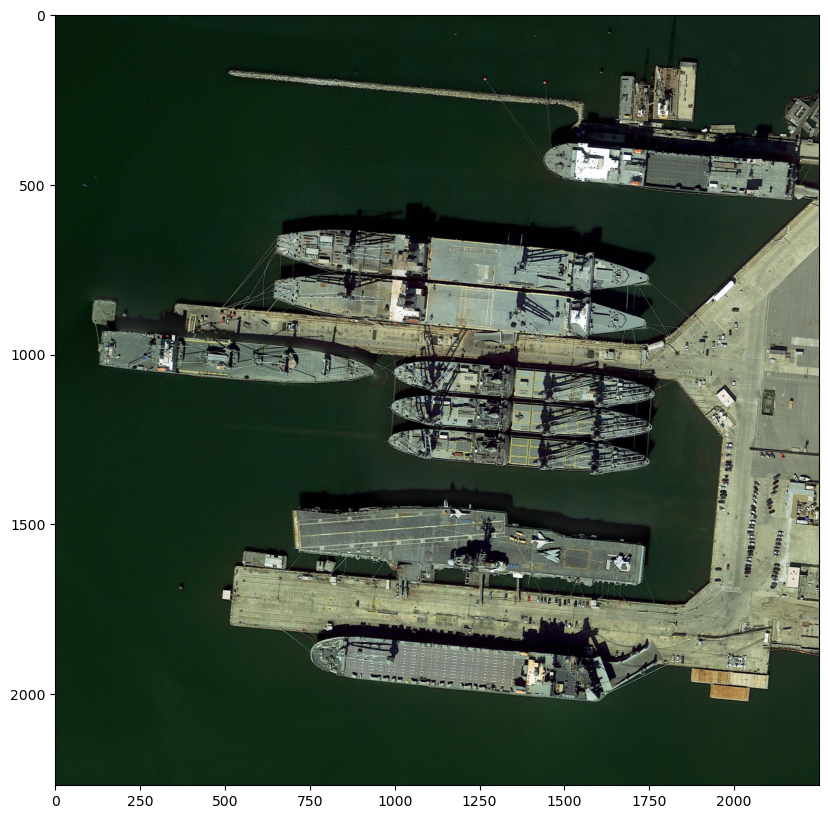

In [6]:
index = 44
image_path = data[index]['image'][0]
print (image_path)
annotations = data[index]['annotations']

box_list = []
label_list = []
segmentation_poly = []
for annotation in annotations:
    box_list.append(annotation['bbox'])
    label_list.append(annotation['label'])
    segmentation_poly.append(annotation['segmentation'])

image_path = data[index]['image'][0]
local_image_path = ('/home/datadisk/evaluation/data/Benchmark/datasets/'+image_path).replace('DOTA_v1.0_rar', 'iSAID')
len(box_list)
print (local_image_path)


image = cv2.imread(local_image_path)
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()

In [7]:

image_source, main_image, gt_image, dice_list, box_list, roi_mask_list = perform_segmentation(sam_predictor, local_image_path, box_list, 
                                                                                              dice_cal=True, segmentation_poly=segmentation_poly, 
                                                                                              label_list = label_list, visualization=True, show_box=False, show_text=True)

save1 = cv2.imwrite(f'/home/kt/python/dump/SAM/{index}_image_source.jpg', image_source)
save2 = cv2.imwrite(f'/home/kt/python/dump/SAM/{index}_segment_image.jpg', main_image)
save2 = cv2.imwrite(f'/home/kt/python/dump/SAM/{index}_gt_image.jpg', gt_image)

NameError: name 'polygon_to_mask' is not defined

In [ ]:

plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(gt_image)
plt.show()


# segment on json data

In [203]:
def SAM_segmentatio_json(sam_predictor, json_path):
    dataset_path = '/home/datadisk/evaluation/data/Benchmark/datasets/'
    # Load the JSON file
    with open(json_path, 'r') as f:
        json_data = json.load(f)

    data_list = json_data['data']
    dice_lists = []
    counter = 0
    for data in data_list:
        image_path = data['image'][0]
        print (f'index[{counter}]: {image_path}')
        counter = counter+1
        annotations = data['annotations']
        
        box_list = []
        label_list = []
        segmentation_poly = []
        for annotation in annotations:
            box_list.append(annotation['bbox'])
            label_list.append(annotation['label'])
            segmentation_poly.append(annotation['segmentation'])

        image_path = data['image'][0]
        local_image_path = dataset_path+image_path
        
        image_source, main_image, gt_image, dice_list, box_list, roi_mask_list = perform_segmentation(sam_predictor, local_image_path, box_list, 
                                                                                              dice_cal=True, segmentation_poly=segmentation_poly, 
                                                                                              label_list = label_list, visualization=True, show_box=True, show_text=False)
        print ("DICE: ",np.sum(dice_list)/len(dice_list))
        dice_lists = dice_lists + dice_list
    return dice_lists

In [ ]:
dice_lists = SAM_segmentatio_json(sam_predictor, file_path)

index[0]: DOTA_v1.0_rar/val/images/images/P2802.png
DICE:  0.781853841054112
index[1]: DOTA_v1.0_rar/val/images/images/P0003.png
DICE:  0.8794085508951149
index[2]: DOTA_v1.0_rar/val/images/images/P0004.png
DICE:  0.9266967119221149
index[3]: DOTA_v1.0_rar/val/images/images/P0007.png
DICE:  0.874681212391277
index[4]: DOTA_v1.0_rar/val/images/images/P0019.png
DICE:  0.8907238559680201
index[5]: DOTA_v1.0_rar/val/images/images/P0027.png
DICE:  0.7725730247781488
index[6]: DOTA_v1.0_rar/val/images/images/P0047.png
DICE:  0.7918034233274782
index[7]: DOTA_v1.0_rar/val/images/images/P0053.png
DICE:  0.8766940372694555
index[8]: DOTA_v1.0_rar/val/images/images/P0056.png
DICE:  0.8325329565408868
index[9]: DOTA_v1.0_rar/val/images/images/P0060.png
DICE:  0.8280027837445119
index[10]: DOTA_v1.0_rar/val/images/images/P0075.png
DICE:  0.9166258710708852
index[11]: DOTA_v1.0_rar/val/images/images/P0079.png
DICE:  0.7949258707288478
index[12]: DOTA_v1.0_rar/val/images/images/P0081.png
DICE:  0.86

DICE:  nan
index[46]: DOTA_v1.0_rar/val/images/images/P0262.png
DICE:  0.8161130690632953
index[47]: DOTA_v1.0_rar/val/images/images/P0300.png
DICE:  0.7328301196829796
index[48]: DOTA_v1.0_rar/val/images/images/P0305.png
DICE:  0.7871287355807024
index[49]: DOTA_v1.0_rar/val/images/images/P0309.png
DICE:  0.7671125205225287
index[50]: DOTA_v1.0_rar/val/images/images/P0329.png
DICE:  0.8302604470329386
index[51]: DOTA_v1.0_rar/val/images/images/P0331.png
DICE:  0.800950758182363
index[52]: DOTA_v1.0_rar/val/images/images/P0336.png
DICE:  0.8455231291168663
index[53]: DOTA_v1.0_rar/val/images/images/P0342.png
DICE:  0.8538065609089674
index[54]: DOTA_v1.0_rar/val/images/images/P0347.png
DICE:  0.7959334141475883
index[55]: DOTA_v1.0_rar/val/images/images/P0348.png
DICE:  0.6490919688448584
index[56]: DOTA_v1.0_rar/val/images/images/P0352.png
DICE:  0.8194914077854685
index[57]: DOTA_v1.0_rar/val/images/images/P0353.png
DICE:  0.8468103354825107
index[58]: DOTA_v1.0_rar/val/images/images

DICE:  0.7897079233400437
index[150]: DOTA_v1.0_rar/val/images/images/P0945.png
DICE:  0.7901368938145699
index[151]: DOTA_v1.0_rar/val/images/images/P0949.png
DICE:  0.7528810396544955
index[152]: DOTA_v1.0_rar/val/images/images/P0953.png
DICE:  0.727119904591066
index[153]: DOTA_v1.0_rar/val/images/images/P0961.png
DICE:  0.7816542362761347
index[154]: DOTA_v1.0_rar/val/images/images/P0962.png
DICE:  0.8310922887100305
index[155]: DOTA_v1.0_rar/val/images/images/P0964.png
DICE:  0.8524149726119344
index[156]: DOTA_v1.0_rar/val/images/images/P0968.png
DICE:  0.8498700429276232
index[157]: DOTA_v1.0_rar/val/images/images/P0969.png
DICE:  0.8743762511306867
index[158]: DOTA_v1.0_rar/val/images/images/P0970.png
DICE:  0.8227310032656828
index[159]: DOTA_v1.0_rar/val/images/images/P0974.png
DICE:  0.8432851468353605
index[160]: DOTA_v1.0_rar/val/images/images/P0977.png
DICE:  0.7494603307384753
index[161]: DOTA_v1.0_rar/val/images/images/P0989.png
DICE:  0.7418497526496308
index[162]: DOT

DICE:  0.8389723813741577
index[253]: DOTA_v1.0_rar/val/images/images/P1513.png
DICE:  0.7724704209655915
index[254]: DOTA_v1.0_rar/val/images/images/P1518.png
DICE:  0.653944827204382
index[255]: DOTA_v1.0_rar/val/images/images/P1529.png
DICE:  0.7549827284122332
index[256]: DOTA_v1.0_rar/val/images/images/P1541.png
DICE:  0.5843880971142821
index[257]: DOTA_v1.0_rar/val/images/images/P1542.png
DICE:  0.8726662471155863
index[258]: DOTA_v1.0_rar/val/images/images/P1547.png
DICE:  0.8225691241206285
index[259]: DOTA_v1.0_rar/val/images/images/P1557.png
DICE:  0.6356601578079578
index[260]: DOTA_v1.0_rar/val/images/images/P1560.png
DICE:  0.8822025927047111
index[261]: DOTA_v1.0_rar/val/images/images/P1561.png
DICE:  0.7410896330122276
index[262]: DOTA_v1.0_rar/val/images/images/P1566.png
DICE:  0.5964119430781649
index[263]: DOTA_v1.0_rar/val/images/images/P1569.png
DICE:  0.742881647559069
index[264]: DOTA_v1.0_rar/val/images/images/P1570.png
DICE:  0.8262625226819568
index[265]: DOTA

In [224]:
np.nansum(dice_lists)/len(dice_lists)

0.7121696957251585

# Old without function

The time of execution: 390238.3575439453 ms


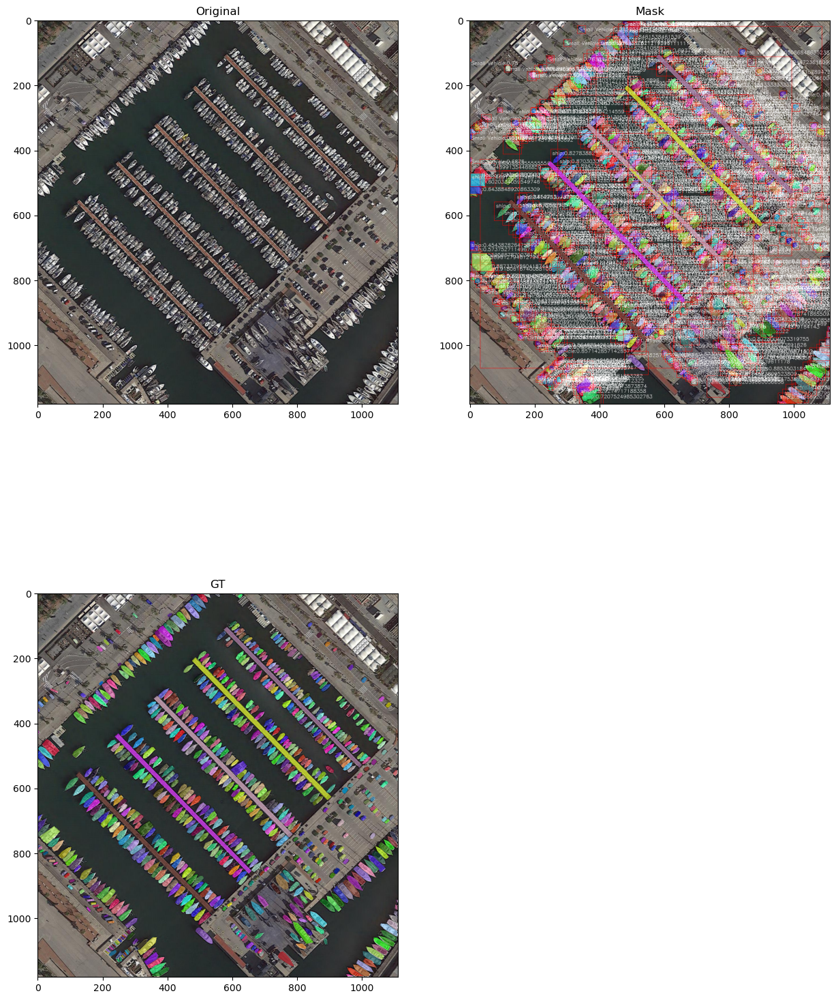

In [322]:
# x_point = 2064.0
# y_point = 3654.0
# w_point = 21.0
# h_point = 30.0




# roi_list = [
#     (1947.0, 2820.0, 224.0, 257.0),  # Example ROI 1
#     (2064.0, 3654.0, 21.0, 30.0),   # Example ROI 2
#     (3110.0, 775.0, 264.0, 260.0)
#     # Add more ROIs as needed
# ]

visualization=True
dice_cal=True


roi_list = box_list

start = time.time()

H, W, _ = image_source.shape
main_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gt_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

dice_list = []
# Iterate over the ROI list and crop the image
for indexing, (x, y, w, h) in enumerate((roi_list)):
    
    isError = False
    if w > h:
        expanded = int(h*0.2)
    else:
        expanded = int(w*0.2)  
    #expanded = int(w*0.15)
    if w > W*0.75 or h > H*0.75:
        if w > h:
            expanded = int(h*0.05)
        else:
            expanded = int(w*0.05)
    
    #GT polygon to mask
    polygon = segmentation_poly[indexing]
    image_height = H  # Replace with actual image height
    image_width = W   # Replace with actual image width

    binary_mask = polygon_to_mask(polygon, image_height, image_width)
    
    # Crop the image using numpy slicing
    cropped_image = image_source[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
    cropped_gt = binary_mask[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
    
    try:
        sam_predictor.set_image(cropped_image)
    except:
        expanded = 0
        cropped_image = image_source[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
        cropped_gt = binary_mask[int(y)-expanded:int(y+h)+expanded, int(x)-expanded:int(x+w)+expanded]
        sam_predictor.set_image(cropped_image)

    bbox = [expanded, expanded, w+expanded, h+expanded]
    
    input_point = np.array([[int(w/2)+expanded, int(h/2)+expanded]])
    input_label = np.array([1])
    
    input_box = np.array(bbox)
    
    
    
    masks, _, _ = sam_predictor.predict(
        point_coords=None,#input_point,
        point_labels=None,#input_label,
        box=input_box[None, :],
        multimask_output=False,
    )
    
    
    roi_mask = masks[0]
    
    
    #calcualate dice
    dice = ''
    if dice_cal:
        try:
            cropped_gt = cropped_gt.squeeze(axis=-1)
            dice = dice_coefficient(roi_mask, cropped_gt)
        except:
            dice = 0
        dice_list.append(dice)
        
    if visualization:
        #visualize overall
        over_y = int(y)-expanded
        over_x = int(x)-expanded
        over_w = int(w) + (expanded*2)
        over_h = int(h) + (expanded*2)


        random_color = np.random.randint(0, 255, (3,), dtype=np.uint8)
        alpha = 0.7


        for i in range(over_h-1):
            for j in range(over_w-1):
                try:
                    if roi_mask[i, j]:
                        existing_pixel = main_image[over_y + i, over_x + j].astype(float)
                        blended_pixel = (1 - alpha) * existing_pixel + alpha * random_color
                        main_image[over_y + i, over_x + j] = np.clip(blended_pixel, 0, 255).astype(np.uint8)
                except:
                    continue



        #GT mask visualization

        for i in range(over_h):
            for j in range(over_w):
                try:
                    if binary_mask[over_y + i, over_x + j]:
                        existing_pixel = gt_image[over_y + i, over_x + j].astype(float)
                        blended_pixel = (1 - alpha) * existing_pixel + alpha * random_color
                        gt_image[over_y + i, over_x + j] = np.clip(blended_pixel, 0, 255).astype(np.uint8)
                except Exception as e:
                    continue


        #draw bbox
        cv2.rectangle(main_image, (over_x, over_y), (over_x + over_w, over_y + over_h), (255, 0, 0), 1)  # Red color, thickness=2
        #cv2.rectangle(gt_image, (over_x, over_y), (over_x + over_w, over_y + over_h), (255, 0, 0), 1)  # Red color, thickness=2

        # Add text to the bounding box
        text = label_list[indexing] +":"+ str(dice)
        font_scale = 0.5
        font_color = (255, 255, 255)  # White color for the text
        font_thickness = 1
        font = cv2.FONT_HERSHEY_SIMPLEX
        text_size, _ = cv2.getTextSize(text, font, font_scale, font_thickness)
        text_x = over_x + 5
        text_y = over_y + text_size[1] + 5

        cv2.putText(main_image, text, (text_x, text_y), font, font_scale, font_color, font_thickness)
        #cv2.putText(gt_image, text, (text_x, text_y), font, font_scale, font_color, font_thickness)

    #     #patch visualiztion
    #     print (label_list[indexing] +":"+ str(dice))
    #     plt.imshow(roi_mask)
    #     plt.show()
    #     plt.imshow(cropped_gt)
    #     plt.show()


end = time.time()

print("The time of execution:",
      (end-start) * 10**3, "ms")

# create figure 
fig = plt.figure(figsize=(15, 20)) 

rows = 2
columns = 2

if visualization:
    # Adds a subplot at the 1st position 
    fig.add_subplot(rows, columns, 1) 
    plt.imshow(image_source)
    plt.title("Original") 

    # Adds a subplot at the 2nd position 
    fig.add_subplot(rows, columns, 2) 
    plt.imshow(main_image)
    plt.title("Mask")

    # Adds a subplot at the 2nd position 
    fig.add_subplot(rows, columns, 3) 
    plt.imshow(gt_image)
    plt.title("GT")
    
#     h, w = masks.shape[-2:]
##visualization each patch
#     plt.figure(figsize=(10, 10))
#     plt.imshow(cropped_image)
#     show_mask(masks[0], plt.gca())
#     show_box(input_box, plt.gca())
#     plt.axis('off')
#     plt.show()

In [324]:
print (f'Average dice: {np.sum(dice_list)/len(box_list)}')
print (len(box_list))
print (image_path)
print (index)
print("The time of execution:",
      (end-start) * 10**3, "ms")


Average dice: 0.7833546395312676
752
DOTA_v1.0_rar/val/images/images/P0706.png
113
The time of execution: 390238.3575439453 ms


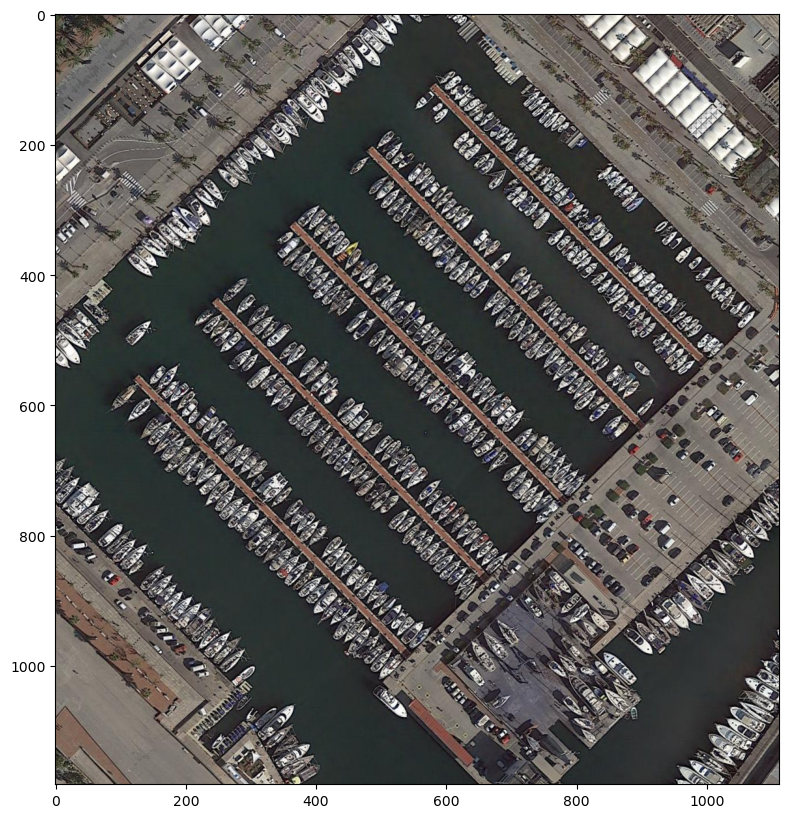

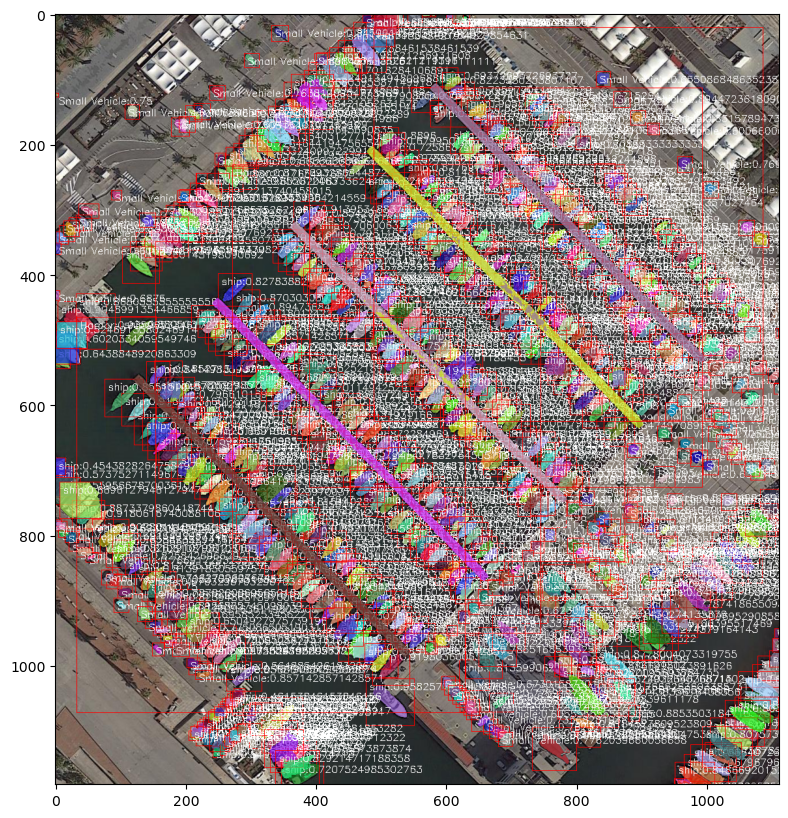

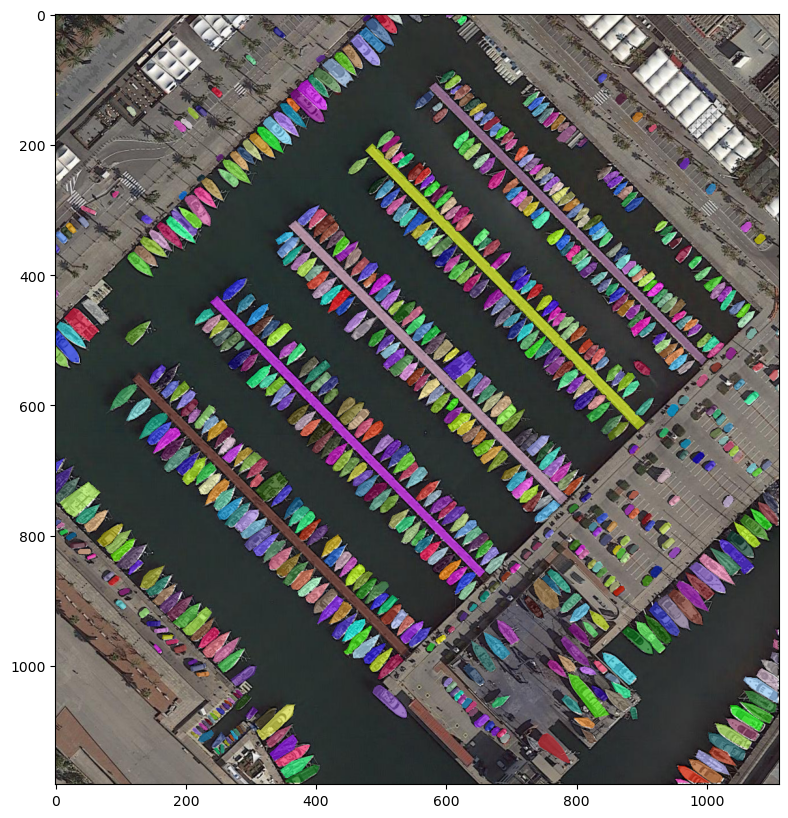

In [326]:
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(gt_image)
plt.show()

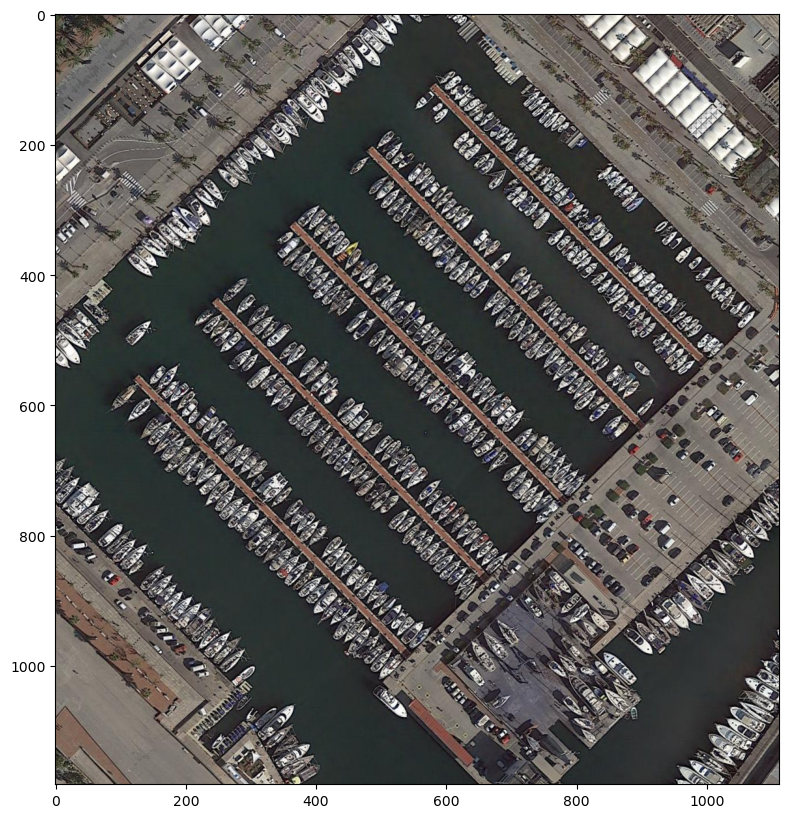

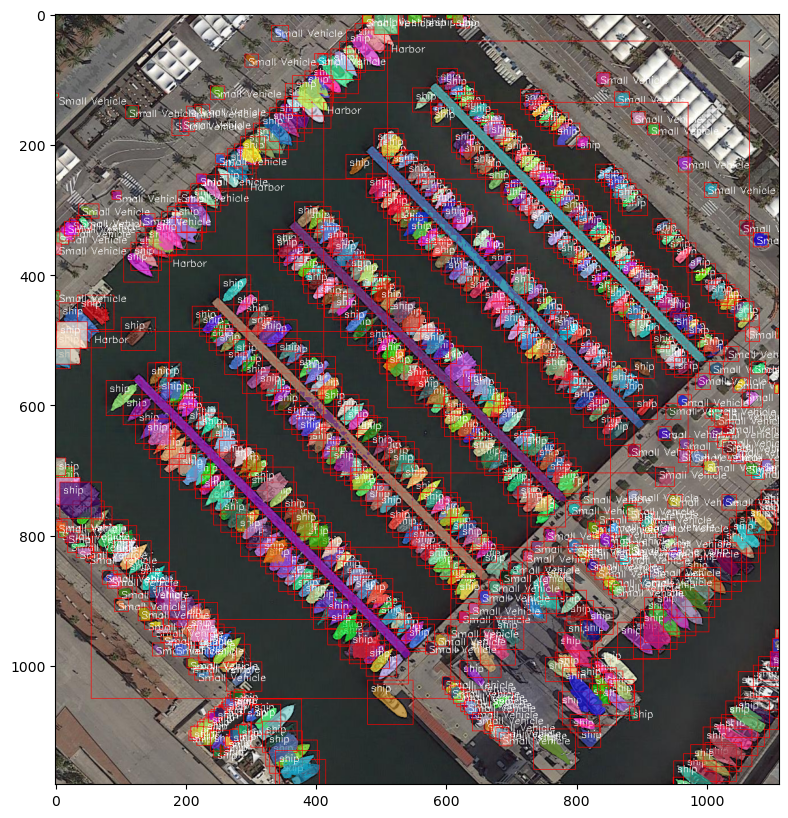

In [202]:
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image_source)
plt.show()
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.show()

Text(0.5, 1.0, 'Mask')

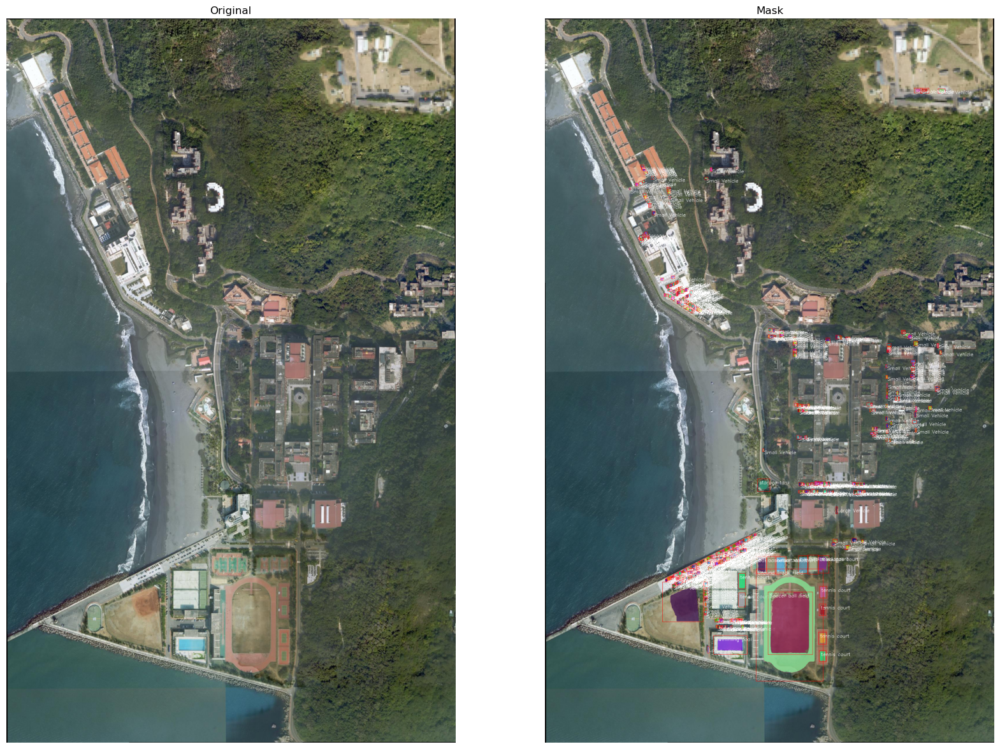

In [230]:
# create figure 
fig = plt.figure(figsize=(20, 20)) 
  
# setting values to rows and column variables 
rows = 1
columns = 2
  
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  
# Adds a subplot at the 1st position 
fig.add_subplot(rows, columns, 1) 
  
# showing image 
plt.imshow(image_source)
plt.axis('off') 
plt.title("Original") 
  
# Adds a subplot at the 2nd position 
fig.add_subplot(rows, columns, 2) 
  
# showing image 
plt.imshow(main_image)
plt.axis('off') 
plt.title("Mask")

Text(0.5, 1.0, 'Mask')

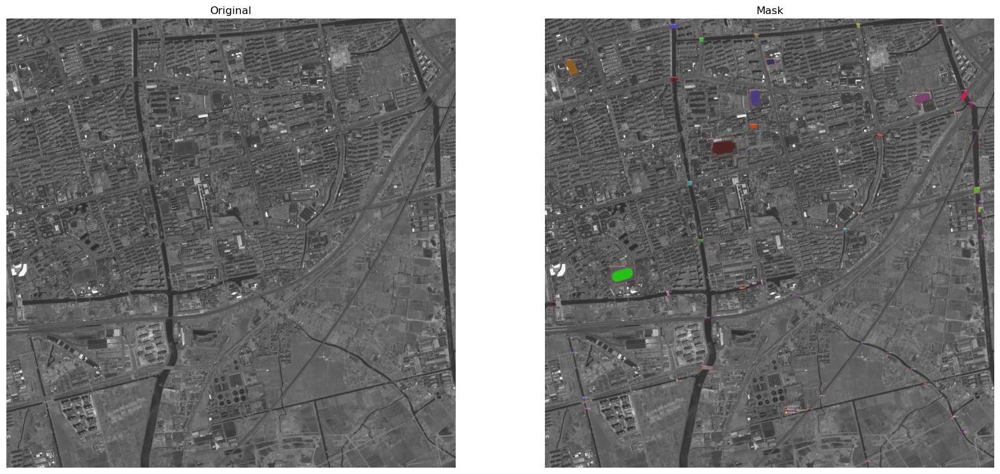

In [239]:
# create figure 
fig = plt.figure(figsize=(20, 20)) 
  
# setting values to rows and column variables 
rows = 1
columns = 2
  
image_source = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  
# Adds a subplot at the 1st position 
fig.add_subplot(rows, columns, 1) 
  
# showing image 
plt.imshow(image_source)
plt.axis('off') 
plt.title("Original") 
  
# Adds a subplot at the 2nd position 
fig.add_subplot(rows, columns, 2) 
  
# showing image 
plt.imshow(main_image)
plt.axis('off') 
plt.title("Mask")

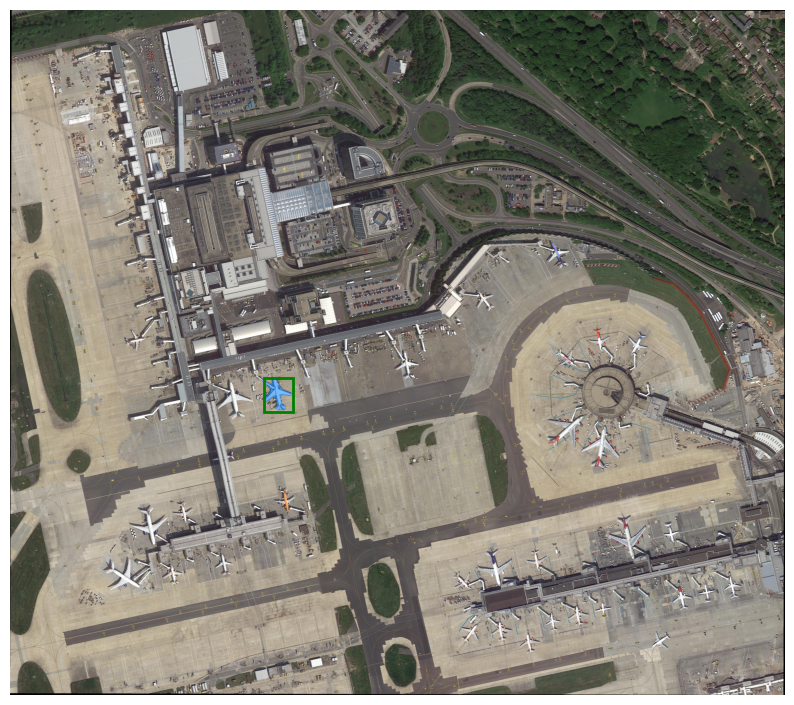

In [9]:

x_point = 1947.0
y_point = 2820.0
w_point = 224.0
h_point = 257.0



bbox = [x_point, y_point, x_point+w_point, y_point+h_point]

input_box = np.array(bbox)

masks, _, _ = sam_predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)


plt.figure(figsize=(10, 10))
plt.imshow(image_source)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

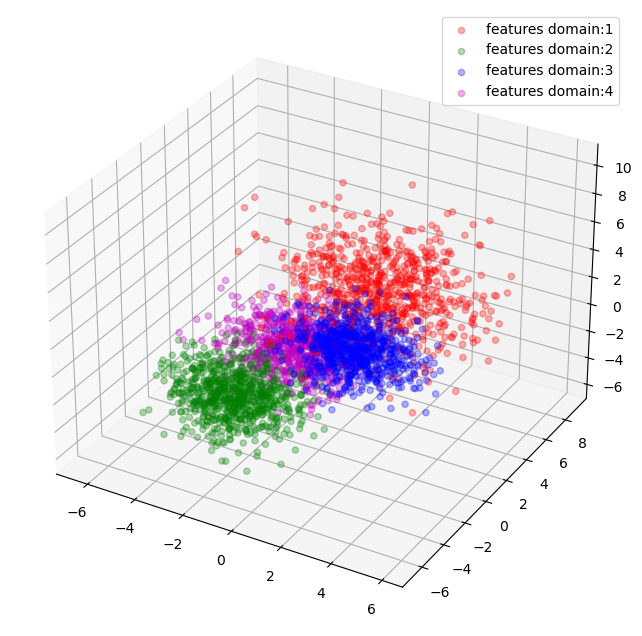

In [349]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from mpl_toolkits.mplot3d import Axes3D

# Set random seed for reproducibility
np.random.seed(42)

# Generate 3D cluster data using make_blobs
n_samples = 3000
centers = [[1, 3, 3], [-2, -3, -2], [2, -1, 2], [-2, 2, -2]]  # Centers of the 4 clusters
cluster_std = [1.9, 1.2, 1.1, 1.2]  # Standard deviation of each cluster, set to 1.2 for some overlap

# Create blobs
X, y = make_blobs(n_samples=n_samples, centers=centers, cluster_std=cluster_std, n_features=3, random_state=42)

# Plot the 3D clusters
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Color map for the clusters
colors = ['r', 'g', 'b', 'm']

for i in range(4):
    ax.scatter(X[y == i, 0], X[y == i, 1], X[y == i, 2], c=colors[i], label=f'features domain:{i+1}', alpha=0.3)

# Add plot labels and title


# Add a legend
ax.legend()

# Show plot
plt.show()

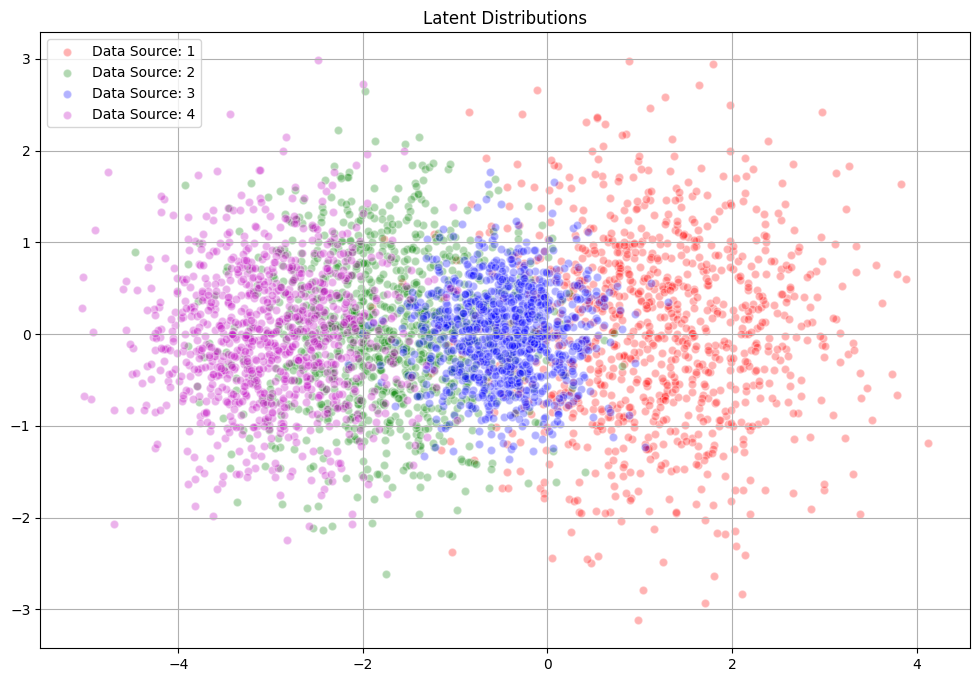

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Parameters
np.random.seed(0)
latent_dim = 10
num_samples = 1000
cluster_variance = 1.0

# Generate synthetic latent variables for four data sources with increased separation
latent_source_1 = np.random.normal(loc=np.zeros(latent_dim), scale=cluster_variance, size=(num_samples, latent_dim))
latent_source_2 = np.random.normal(loc=np.ones(latent_dim) * 0.9, scale=cluster_variance*0.8, size=(num_samples, latent_dim))
latent_source_3 = np.random.normal(loc=np.ones(latent_dim) * 0.5, scale=cluster_variance*0.5, size=(num_samples, latent_dim))
latent_source_4 = np.random.normal(loc=np.ones(latent_dim) * 1.3, scale=cluster_variance*0.7, size=(num_samples, latent_dim))
latent_source_5 = np.random.normal(loc=np.ones(latent_dim) * -0.9, scale=cluster_variance*1.1, size=(num_samples, latent_dim))

# Combine the latent distributions into one array with labels
latents = np.vstack([
    np.hstack([latent_source_1, np.zeros((num_samples, 1)) + 1]),  # Label 1
    np.hstack([latent_source_2, np.zeros((num_samples, 1)) + 2]),  # Label 2
    np.hstack([latent_source_3, np.zeros((num_samples, 1)) + 3]),  # Label 3
    np.hstack([latent_source_4, np.zeros((num_samples, 1)) + 4]),   # Label 4
    np.hstack([latent_source_5, np.zeros((num_samples, 1)) + 5])   # Label 4
])

# Reduce dimensionality for visualization (PCA)
pca = PCA(n_components=2)
latents_2d = pca.fit_transform(latents[:, :-1])
labels = latents[:, -1]

# Plot the latent distributions
plt.figure(figsize=(12, 8))
colors = ['r', 'r','g', 'b', 'm']
for i in range(4):
    plt.scatter(latents_2d[labels == i+1, 0], latents_2d[labels == i+1, 1], c=colors[i+1], label=f'Data Source: {i+1}', alpha=0.3, edgecolors='w')


plt.title('Latent Distributions')


#plt.ylim (bottom = 0, top = 4)
#plt.yticks(np.arange(1,5,1))
plt.legend()
plt.grid(True)
plt.show()

/tmp/ipykernel_539440/3253445820.py:19: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  latent_source_1 = np.random.multivariate_normal(mean=[0, 0], cov=cov_ellipse1, size=num_samples)
/tmp/ipykernel_539440/3253445820.py:20: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  latent_source_2 = np.random.multivariate_normal(mean=[1, 2], cov=cov_ellipse2, size=num_samples)
/tmp/ipykernel_539440/3253445820.py:22: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  latent_source_4 = np.random.multivariate_normal(mean=[1.5, 3], cov=cov_ellipse4, size=num_samples)


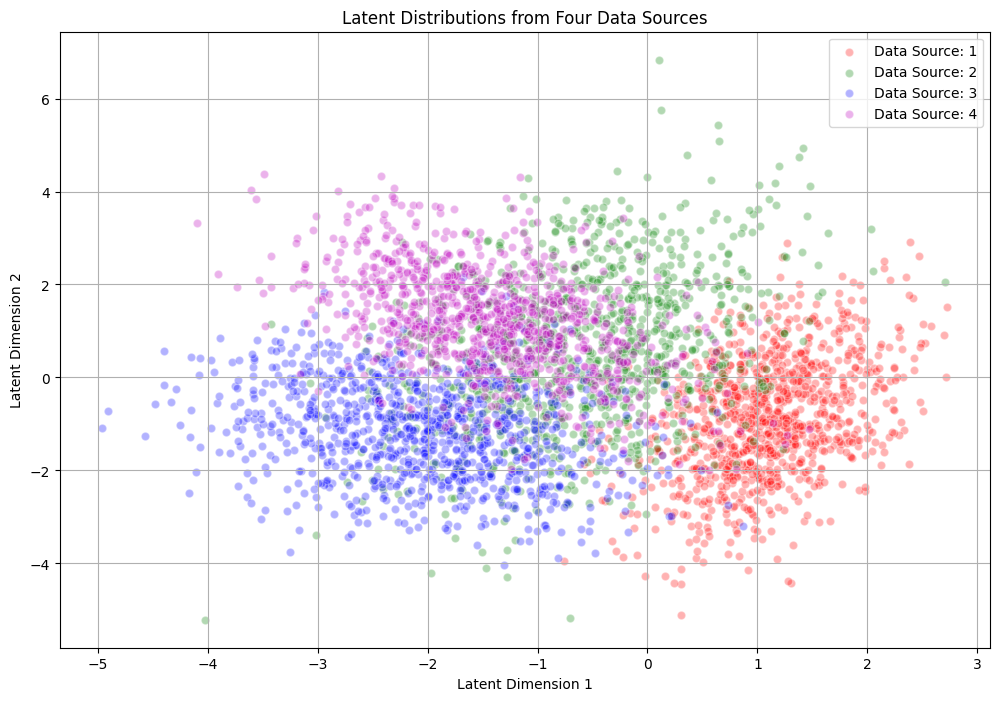

In [136]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Parameters
np.random.seed(0)
latent_dim = 10
num_samples = 1000
cluster_variance = 1.0

# Generate covariance matrices for elliptical shapes
cov_ellipse1 = np.array([[1.5, 0.2], [1, -0.2]])
cov_ellipse2 = np.array([[2, 0.5], [-2, 0.5]])
cov_ellipse3 = np.array([[1, 0.3], [0.3, 1]])
cov_ellipse4 = np.array([[0.4, -0.3], [1, 1]])
cov_ellipse5 = np.array([[0.3, -0.3], [-0.3, 1]])

# Generate synthetic latent variables with elliptical covariance matrices
latent_source_1 = np.random.multivariate_normal(mean=[0, 0], cov=cov_ellipse1, size=num_samples)
latent_source_2 = np.random.multivariate_normal(mean=[1, 2], cov=cov_ellipse2, size=num_samples)
latent_source_3 = np.random.multivariate_normal(mean=[-1, 3], cov=cov_ellipse3, size=num_samples)
latent_source_4 = np.random.multivariate_normal(mean=[1.5, 3], cov=cov_ellipse4, size=num_samples)
latent_source_5 = np.random.multivariate_normal(mean=[1.5, -1.5], cov=cov_ellipse5, size=num_samples)

# Combine the latent distributions into one array with labels
latents = np.vstack([
    np.hstack([latent_source_1, np.zeros((num_samples, 1)) + 1]),  # Label 1
    np.hstack([latent_source_2, np.zeros((num_samples, 1)) + 2]),  # Label 2
    np.hstack([latent_source_3, np.zeros((num_samples, 1)) + 3]),  # Label 3
    np.hstack([latent_source_4, np.zeros((num_samples, 1)) + 4]),  # Label 4
    np.hstack([latent_source_5, np.zeros((num_samples, 1)) + 5])   # Label 4
])

# Reduce dimensionality for visualization (PCA)
pca = PCA(n_components=2)
latents_2d = pca.fit_transform(latents[:, :-1])
labels = latents[:, -1]

# Plot the latent distributions
plt.figure(figsize=(12, 8))
colors = ['r', 'r','g', 'b', 'm']
for i in range(4):
    plt.scatter(latents_2d[labels == i+1, 0], latents_2d[labels == i+1, 1], c=colors[i+1], label=f'Data Source: {i+1}', alpha=0.3, edgecolors='w')

plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.title('Latent Distributions from Four Data Sources')

# Set y-axis limits and ticks to fit the data


plt.legend()
plt.grid(True)
plt.show()

# TEST visualization

In [ ]:
polygon_to_mask